## 04 EEG Image Reconstruction

In [1]:
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader, Dataset, TensorDataset
from torch.optim import *

import torchvision
import torchvision.transforms as transforms

import matplotlib.pyplot as plt
import numpy as np

import os
import random
import warnings
warnings.filterwarnings("ignore")

from torchvision.utils import make_grid, save_image
from termcolor import colored

from IPython.display import clear_output
%matplotlib inline
from chosen_gpu import get_freer_gpu

#### Check GPU availability

In [2]:
device = torch.device(get_freer_gpu()) 
print("Configured device: ", device)

Configured device:  cuda:0


### Define stuffs

In [3]:
par = "par1"
task = "imagery"
model_name = "cnn"
drift = "drift"

### 1. Load Data
***

#### 1.1 Load Stimulus Data

* 1 = Red
* 2 = Green
* 3 = Blue

In [4]:
batch_size = 3 # ideal batch size ranges from 32 to 128
image_size = 224
img_nc     = 1

trsfm = transforms.Compose([transforms.Resize(image_size), 
                            transforms.CenterCrop(image_size),
                            transforms.ToTensor()])

from PIL import Image
real_images_fabby = torch.zeros((3,3,224,224))
# print(real_images_fabby[0].shape)

red = Image.open('../2-HCI_stimuli/stimulus/cylinder/R/1.png')
red = trsfm(red.convert('RGB'))
green = Image.open('../2-HCI_stimuli/stimulus/cylinder/G/2.png')
green = trsfm(green.convert('RGB'))
blue = Image.open('../2-HCI_stimuli/stimulus/cylinder/B/3.png')
blue = trsfm(blue.convert('RGB'))

real_images_fabby[0] = red
real_images_fabby[1] = green
real_images_fabby[2] = blue
real_images = real_images_fabby
print(real_images.shape)

actual_y = [0,1,2]
actual_y = torch.Tensor(actual_y).long()
print(actual_y)

torch.Size([3, 3, 224, 224])
tensor([0, 1, 2])


#### 1.2 Load the latent EEG features and y labels


In [5]:
EEG_latent = np.load('../data/participants/{par}/{task}/extracted_features_X.npy'.format(par=par,task=task))
y = np.load('../data/participants/{par}/{task}/extracted_features_y.npy'.format(par=par,task=task))

print("Shape of EEG_latent: ",EEG_latent.shape)
print("y: ",y[:20])

Shape of EEG_latent:  (486, 32)
y:  [2 0 1 2 0 0 0 0 2 2 2 0 1 0 2 0 2 1 2 1]


##### 1.2.1 Convert to torch

In [6]:
torch_X = torch.from_numpy(EEG_latent)
torch_y = torch.from_numpy(y)
print("Shape of torch_X: ", torch_X.shape)
print("Shape of torch_y: ", torch_y.shape)

Shape of torch_X:  torch.Size([486, 32])
Shape of torch_y:  torch.Size([486])


##### 1.2.2 Dataloader

BalancedBatchSampler allows equal number of classes to be drawn.

In [7]:
from BalancedBatchSampler import BalancedBatchSampler

In [8]:
latent_dataset = TensorDataset(torch_X, torch_y)

n_classes = 3
n_samples = 1

balanced_batch_sampler = BalancedBatchSampler(latent_dataset, n_classes, n_samples)

In [9]:
batch_size = 3

latent_loader = DataLoader(latent_dataset,
                batch_sampler = balanced_batch_sampler,
                pin_memory = True) # True = copy Tensors into CUDA pinned memory before returning them

In [10]:
dataiter = iter(latent_loader)
latents, labels = dataiter.next()

print("number of batches: ",len(latent_loader))
print("Shape of latents: ",latents.shape)
print("Shape of labels: ",labels.shape)

number of batches:  162
Shape of latents:  torch.Size([3, 32])
Shape of labels:  torch.Size([3])


### 2. Training Parameters 
***

In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import fnmatch

from models import Generator
from models import Discriminator

In [12]:
def do_plot(d_losses, g_losses):
    plt.figure(figsize=(25,5))
#     clear_output(wait=True)
    plt.plot(d_losses, label='Discriminator')
    plt.plot(g_losses, label='Generator')
    plt.title('GAN loss')
    plt.legend()
    plt.show()
    
def random_2D_noise(m,n):
    """
    Random an 2d array of random noise
    =======================
    m = # of samples
    n = # of features
    """
    z     = np.random.uniform(-1, 1, size=(m,n))
    z     = torch.from_numpy(z).float()
    return z

def display_img(img, epoch,labels):
    img = img.cpu()
    img = img.reshape(-1,3,224,224)
    grid = make_grid(img, nrow=10, normalize=True, padding=0)
    save_image(grid,f"../data/participants/{par}/{task}/generated_img/epoch_{epoch}.png".format(par=par,task=task).format(par=par,task=task, epoch=epoch))
    fig, ax = plt.subplots(figsize=(20,100))
    ax.imshow(grid.permute(1, 2, 0).data)
    ax.axis('off')

#### 2.1 Models

In [13]:
from models import Generator
from models import Discriminator

G_net = Generator(input_size = 48, hidden_size = 96 , output_size = 150528).to(device)
D_net = Discriminator(input_size = 150528, hidden_size = 64).to(device)

#### 2.2 Optimizers

In [14]:
lr = 0.0002
G_optimizer = torch.optim.Adam(G_net.parameters(), lr=lr)
D_optimizer = torch.optim.Adam(D_net.parameters(), lr=lr)
                 
gamma = 0.5
G_lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(G_optimizer, gamma=gamma)
D_lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(D_optimizer, gamma=gamma)

#### 2.3 Loss functions

In [15]:
BCE_loss_criterion = nn.BCEWithLogitsLoss().to(device) # use with rf_decision
d_classify_criterion = nn.CrossEntropyLoss().to(device) # use with num_decision
lamda = 0.01
semantic_criterion = nn.MSELoss().to(device)

#### 2.4 Epochs

In [16]:
# Number of iterations
NUM_EPOCH   = 10       ## > 50 epoch
print_every = 400
g_best_valid_loss = float('inf')
d_best_valid_loss = float('inf')

#### 2.5 Initialize Lists

In [17]:
# For plotting
d_losses    = []
g_losses    = []

g_recon_image_list   = []
eeg_original_labels  = []
gd_class_decision_from_fake_image_list = []

#### 3.6 Define Noise

In [18]:
noise_size = 16
noise_size_latent = 32

## 6. Train

In [19]:
# rearrange order -> RGB
def rearrange(eeg_latent, labels):
    labels_sorted = torch.argsort(labels)

    eeg_latent_ = eeg_latent[labels_sorted]
    labels_ = labels[labels_sorted]
    return eeg_latent_, labels_

Epoch : 10/10 | Iteration : 1450 | d_loss: 0.407847 | g_loss: 0.259020


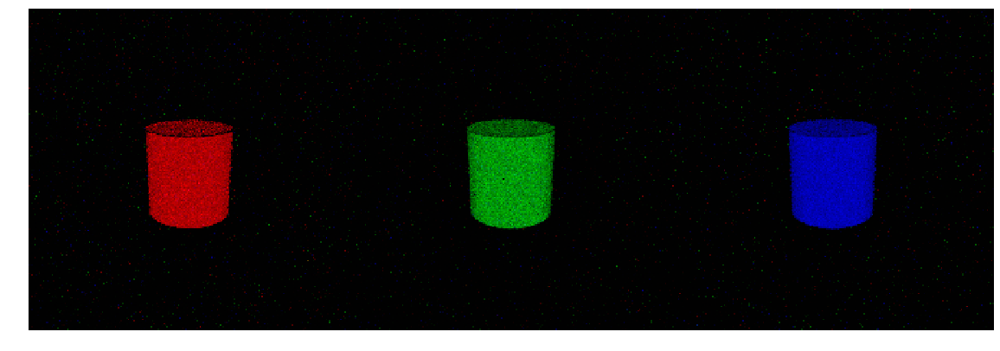

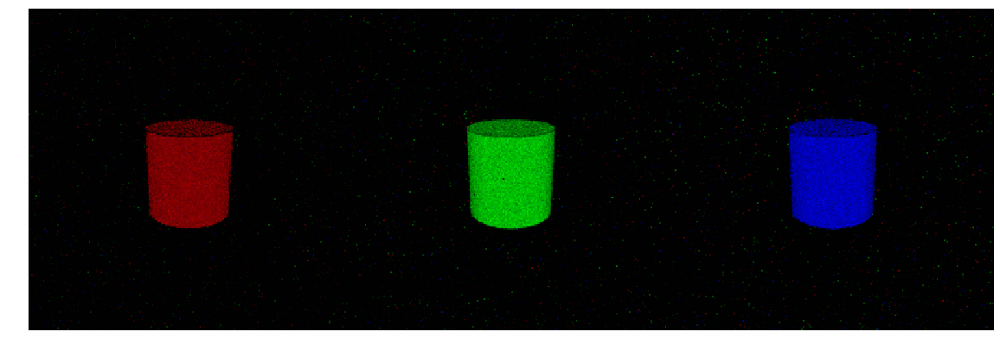

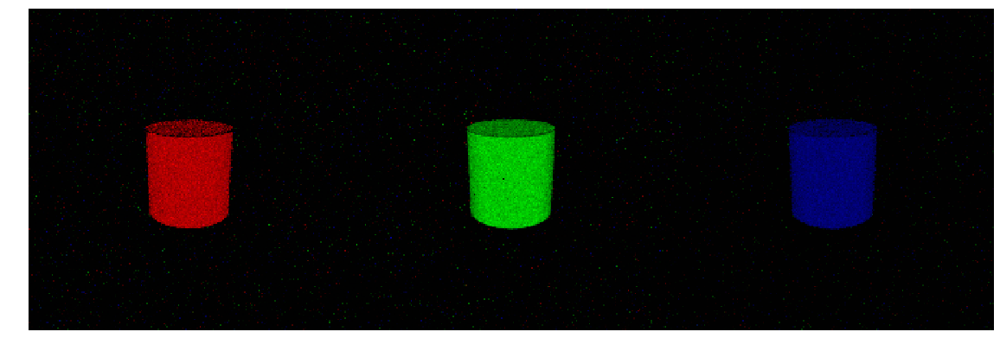

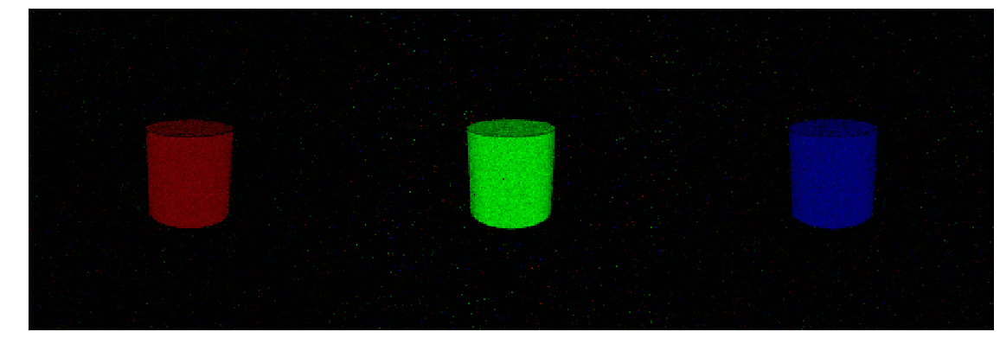

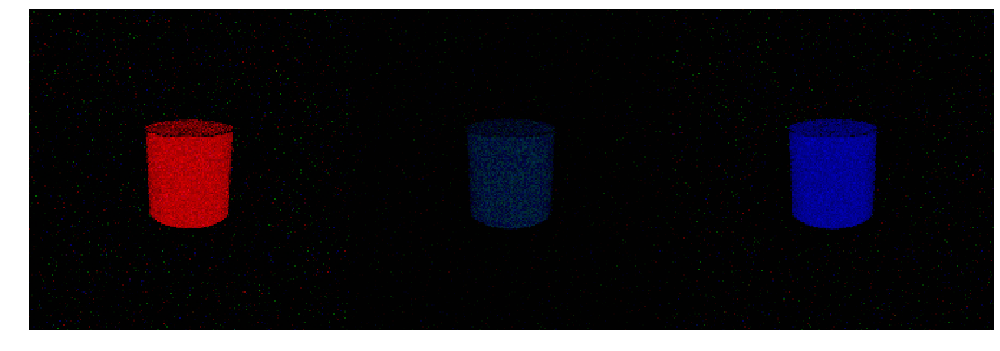

...

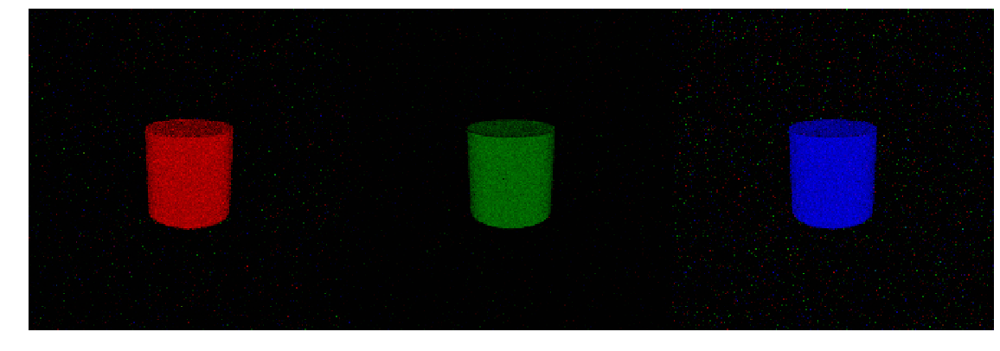

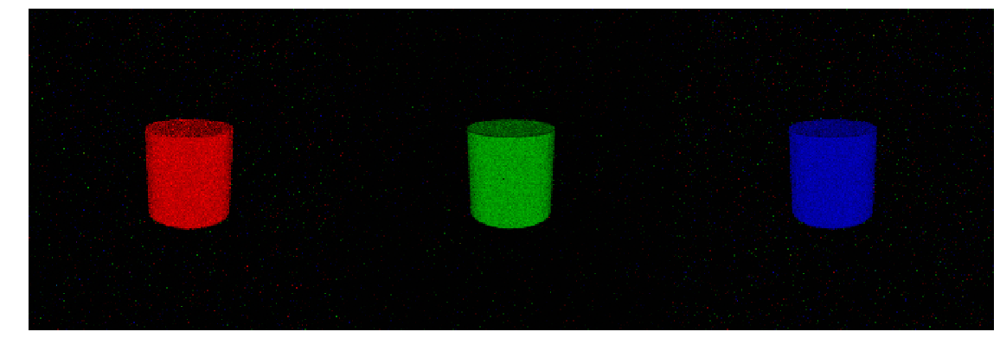

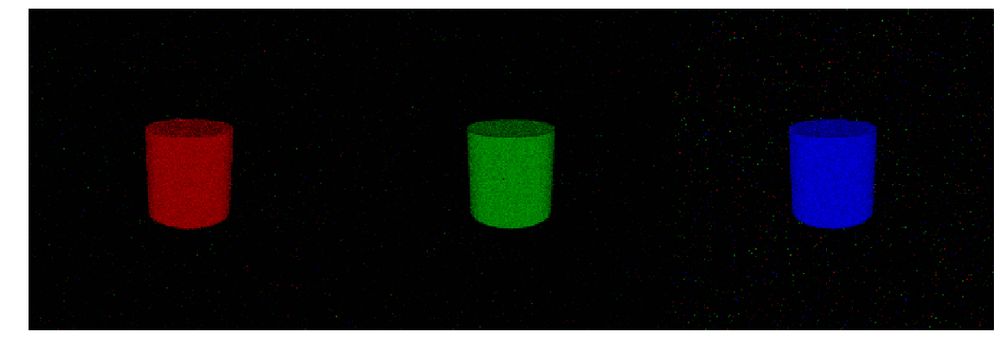

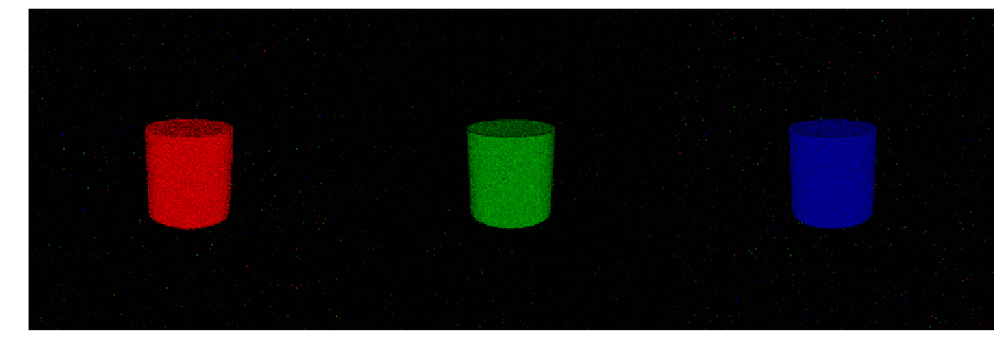

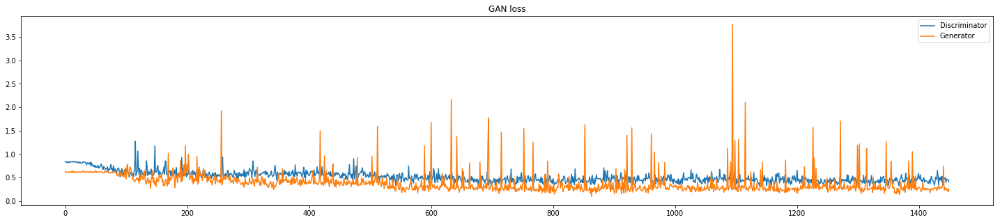

epoch:  9 batch:  5
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  10
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  15
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  20
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  25
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  30
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  35
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  40
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  45
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  50
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  55
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  60
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  65
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  70
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  75
labels:  tensor([0, 1, 2], device='cuda:0')
epoch:  9 batch:  80
label

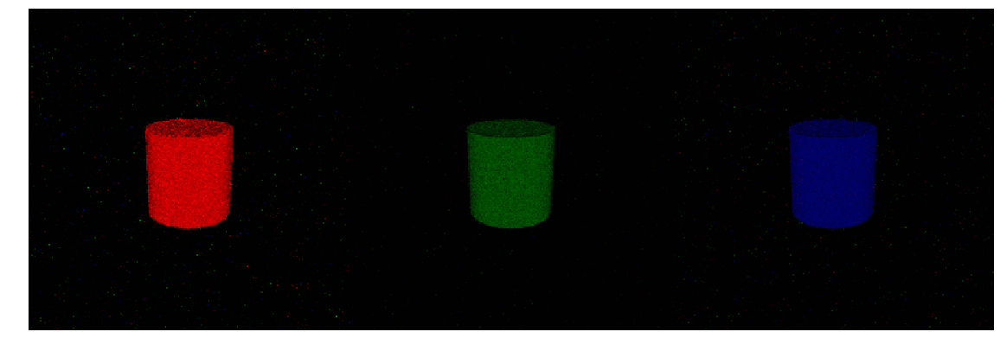

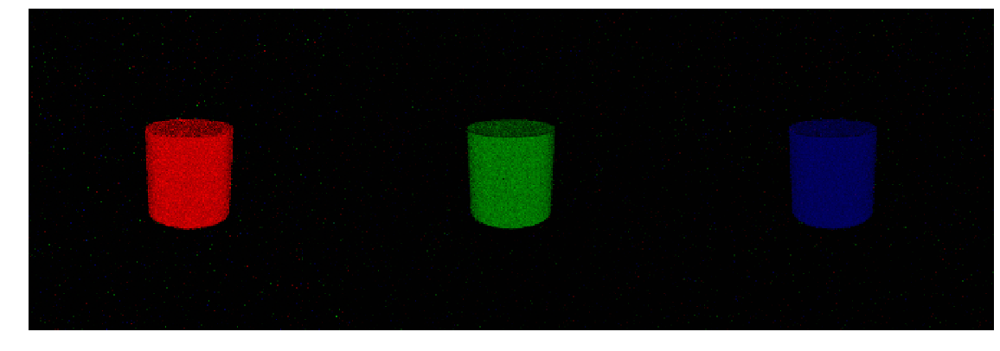

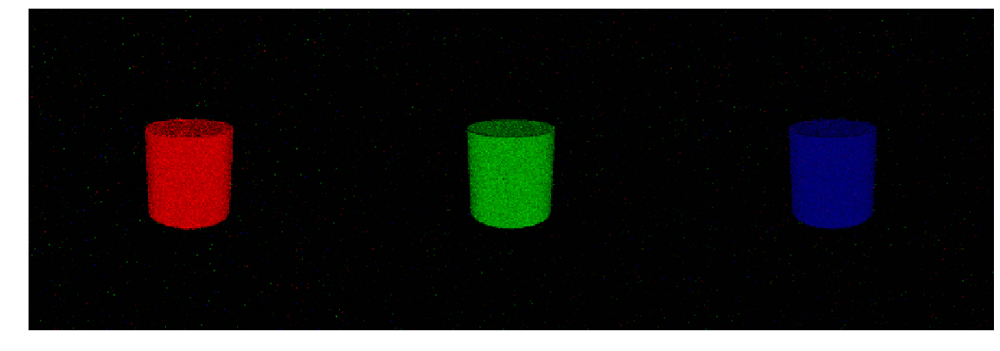

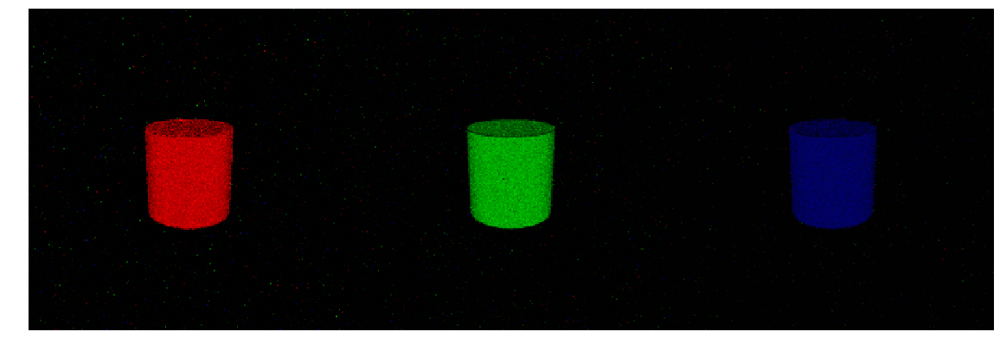

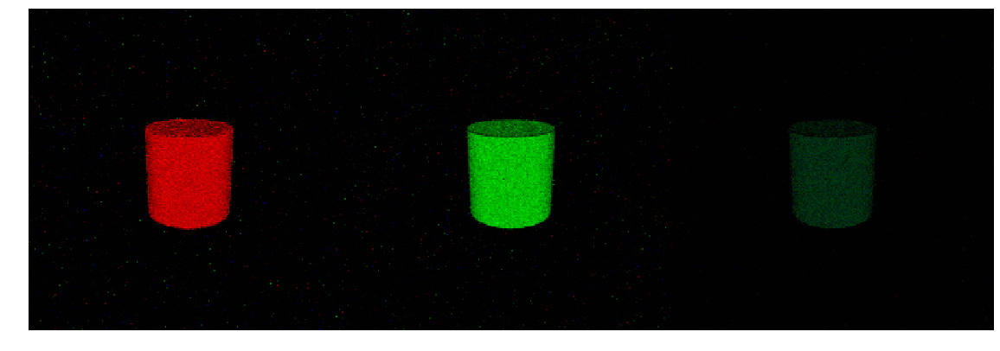

...

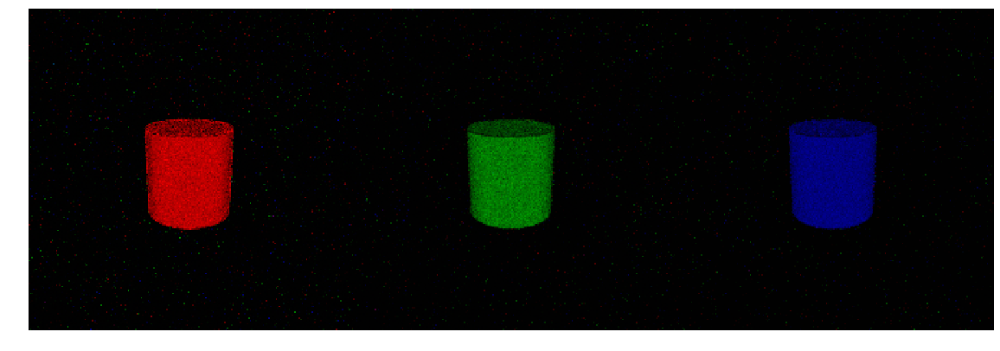

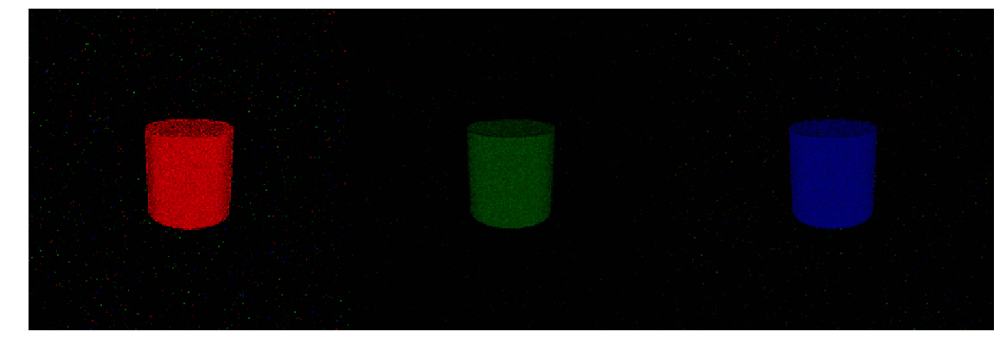

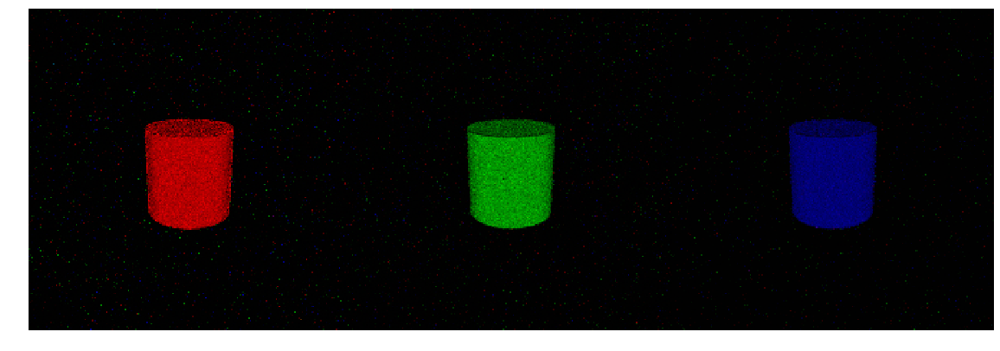

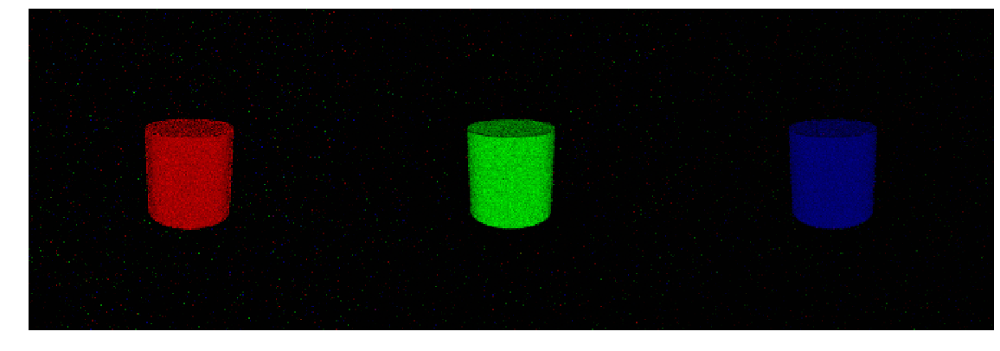

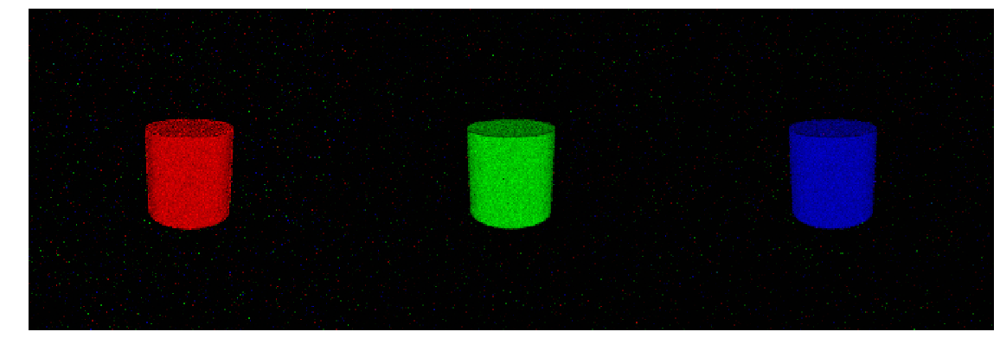

In [20]:
# set G and D in TRAIN MODE ( DO dropout )
G_net.train()
D_net.train()
# noise_latent = random_2D_noise(batch_size, 32)
# zero_latent = torch.from_numpy(np.zeros((batch_size,32) )).to(device).float()

iteration = 0
for epoch in range(NUM_EPOCH):
    
    for batch_i , (eeg_latent, labels ) in enumerate(latent_loader):
        
        eeg_latent, labels = rearrange(eeg_latent, labels)
        
        G_net.train()
        D_net.train()
        
        # ======== TRAIN DISCRIMINATOR ===========
        D_net.zero_grad()
        G_net.zero_grad()
        D_optimizer.zero_grad()
        
        eeg_latent = eeg_latent.to(device)
        labels     = labels.to(device)
       
        #---------- create all noises -------
        noise_latent = random_2D_noise(batch_size, noise_size_latent)
        noise_latent = noise_latent.to(device)

        noise_d = random_2D_noise(batch_size, noise_size)
        noise_d = noise_d.to(device)

        noise_g = random_2D_noise(batch_size, noise_size)
        noise_g = noise_g.to(device)
        
        #---------- Train with real image -------
        real_images = real_images.to(device)
        actual_y = actual_y.to(device)
        
        #rf_decision_real_image, num_decision_real_image = D_net(real_images, noise_latent)   
        d_decision_out, d_class_out = D_net(real_images, noise_latent)   
        all_real_labels = torch.from_numpy(np.ones(d_decision_out.shape)).to(device)
        
        d_loss_with_real_img = BCE_loss_criterion( d_decision_out  ,  all_real_labels  )
        d_classify_loss = d_classify_criterion(     d_class_out  ,    actual_y         )
        
        
        #---------- Train with fake image -------
        d_recon_image = G_net(eeg_latent, noise_d)
        d_decision_out, d_class_out = D_net(d_recon_image, eeg_latent) 
        all_fake_labels = torch.from_numpy(np.zeros(d_decision_out.shape)).to(device)
        
        d_loss_with_fake_img  = BCE_loss_criterion(d_decision_out, all_fake_labels)
        d_loss = (d_loss_with_real_img + d_classify_loss + d_loss_with_fake_img)/3
        
        d_loss.backward()
        D_optimizer.step()
#         D_lr_scheduler.step()  
        
        d_losses.append(d_loss.item())
    
        # ======== TRAIN GENERATOR ===========
        D_net.zero_grad()
        G_net.zero_grad()  
        G_optimizer.zero_grad()
        
        G_recon_image = G_net(eeg_latent, noise_g)
        
        if batch_i == 0:
            print("epoch: ", epoch, "batch: ", batch_i)
            print("labels: ", labels)
            display_img(G_recon_image, epoch, labels)
        
        gd_decision_out, gd_class_decision_from_fake_image = D_net(G_recon_image , eeg_latent)
        gd_class_decision_from_fake_image_list.append(gd_class_decision_from_fake_image)
        
        all_real_labels = torch.from_numpy(np.ones(gd_decision_out.shape)).to(device)
    
        semantic_loss = semantic_criterion(G_recon_image, real_images[labels])
        gd_fake_rf_loss = BCE_loss_criterion(gd_decision_out, all_real_labels)
        gd_fake_num_loss= d_classify_criterion(gd_class_decision_from_fake_image, labels)
        
        g_loss = (gd_fake_rf_loss + gd_fake_num_loss + (lamda*semantic_loss))/3

#         g_loss = (gd_fake_rf_loss + gd_fake_num_loss)/3
        g_loss.backward()
        G_optimizer.step()

        g_losses.append(g_loss.item())
        eeg_original_labels.append(labels)
        g_recon_image_list.append(G_recon_image)
        
        iteration     += 1
        
        #--------- Display loss---------
        if batch_i % print_every == 0:
            clear_output(wait=True)
            print('Epoch : {:1d}/{:1d} | Iteration : {:1d} | d_loss: {:6.6f} | g_loss: {:6.6f}'.format(epoch+1, NUM_EPOCH, iteration, d_loss.item(), g_loss.item()))
            do_plot(d_losses, g_losses)

        #------- Save Discriminator ------     
        if d_loss < d_best_valid_loss:
            d_best_valid_loss = d_loss
            print("Discriminator saved.")
            torch.save(D_net.state_dict(), "../model/our_GAN/round2/{par}/{model_name}/{drift}/DISCRIMINATOR_{task}.pt.tar".format(par=par, model_name=model_name,drift=drift,task=task))
#             d_best_valid_loss = i
        
        #--------- Save Generator ---------   
        if g_loss < g_best_valid_loss:
            g_best_valid_loss = g_loss
            print("Generator saved.")
            torch.save(G_net.state_dict(), "../model/our_GAN/round2/{par}/{model_name}/{drift}/GENERATOR_{task}.pt.tar".format(par=par, model_name=model_name,drift=drift,task=task))
#             g_best_valid_loss = i  

### 7. Display Reconstructed Images of The Last Batch
***

In [21]:
## Display stim reconstruct of last batch

from torchvision.utils import make_grid
from termcolor import colored


print(len(g_recon_image_list))

batch_to_display = 1

images_lastbatch = g_recon_image_list[-batch_to_display]
labels_lastbatch = eeg_original_labels[-batch_to_display]
images_lastbatch = images_lastbatch.cpu()
display_img(images_lastbatch,'last_batch',labels_lastbatch)

print(f'Y oringinal {eeg_original_labels[-batch_to_display]}')
print(f'Y predicted {torch.max(gd_class_decision_from_fake_image_list[-batch_to_display],dim=1)[1]}')
print(colored("Generated image of last batch","blue", attrs=['bold']))

1610


TypeError: display_img() missing 1 required positional argument: 'i'

### 8. Evaluate
***
Test pipline:

eeg_test_set --> encoder--> latent --> Generator --> reconstructed_image --> Discriminator --> h_hat (class) --> calculate accuracy

In [ ]:
from models import EEGEncoder

In [ ]:
def save_gen_img(imgs, labels, name):
    labels = labels.cpu()
    np.save('../data/participants/{par}/{task}/FID/{name}/generated_labels'.format(par=par,task=task,name=name), labels)
    for i in range(len(imgs)):
        img = imgs[i]
        img = img.cpu()
        img = img.reshape(-1,3,224,224)
        grid = make_grid(img, nrow=1, normalize=True, padding=0)
        save_image(grid,"../data/participants/{par}/{task}/FID/{name}/image_{i}.png".format(par=par,task=task,name=name,i=i))    

#### 8.1 Test

##### 8.1.1 Load Data and Data Loader

In [ ]:
# # Load data
X_test = np.load("../data/participants/{par}/{task}/X_test.npy".format(par=par,task=task).format(par=par,task=task))
y_test = np.load("../data/participants/{par}/{task}/y_test.npy".format(par=par,task=task).format(par=par,task=task))

# Convert to torch
torch_X_test = torch.from_numpy(X_test)
torch_X_test_reshaped = torch_X_test.reshape(torch_X_test.shape[0],torch_X_test.shape[1],1,torch_X_test.shape[2])
torch_y_test = torch.from_numpy(y_test)

# Data loader
test_dataset = TensorDataset(torch_X_test_reshaped, torch_y_test)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=54)
print(len(test_loader))

itertest = iter(test_loader)
eeg_X_test , labels_test = itertest.next()

# To device
eeg_X_test = eeg_X_test.to(device).float()
labels_test = labels_test.to(device)

##### 8.1.2 Encoder

In [ ]:
# Define model
model_eeg_encoder_test = EEGEncoder()
model_eeg_encoder_test.load_state_dict(torch.load('../model/feature_extraction/round2/{par}/{model_name}/{drift}/EEG_ENCODER_{task}.pt.tar'.format(par=par,model_name=model_name,drift=drift,task=task)))#.to(device)
model_eeg_encoder_test.eval().to(device)

# Get latent
X_test_latent = model_eeg_encoder_test.get_latent(eeg_X_test)

##### 8.1.3 GAN

In [ ]:
### Feed latent to Generator
G_net_test = Generator(input_size = 48, hidden_size = 96, output_size = 150528).to(device)
G_net_test.eval()

noise_test = random_2D_noise(X_test_latent.shape[0], noise_size)
noise_test = noise_test.to(device)

G_net_test.load_state_dict(torch.load('../model/our_GAN/round2/{par}/{model_name}/{drift}/GENERATOR_{task}.pt.tar'.format(par=par,model_name=model_name,drift=drift,task=task)))

g_imag_recon_test = G_net_test(X_test_latent, noise_test)

#### Feed image reconstruction to discriminator
D_net_test = Discriminator(input_size = 150528, hidden_size = 64 ).to(device)
D_net_test.eval()

D_net_test.load_state_dict(torch.load('../model/our_GAN/round2/{par}/{model_name}/{drift}/DISCRIMINATOR_{task}.pt.tar'.format(par=par,model_name=model_name,drift=drift,task=task)))
d_test_decision_test , d_class_decision_from_fake_image_test = D_net_test(g_imag_recon_test , X_test_latent)

##### 8.1.4 Generated images

In [ ]:
name = "test"

save_gen_img(g_imag_recon_test, labels_test, name)

#### 8.2 REAL TEST

##### 8.2.1 Load Data and Data Loader

In [ ]:
# Load data
X_real_test = np.load("../data/participants/{par}/{task}/X_real_test.npy".format(par=par,task=task).format(par=par,task=task))
y_real_test = np.load("../data/participants/{par}/{task}/y_real_test.npy".format(par=par,task=task).format(par=par,task=task))

# Convert to torch
torch_X_real_test = torch.from_numpy(X_real_test)
torch_X_real_test_reshaped = torch_X_real_test.reshape(torch_X_real_test.shape[0],torch_X_real_test.shape[1],1,torch_X_real_test.shape[2])
torch_y_real_test = torch.from_numpy(y_real_test)

# Data loader
real_test_dataset = TensorDataset(torch_X_real_test_reshaped, torch_y_real_test)
real_test_loader = torch.utils.data.DataLoader(real_test_dataset, batch_size=54)

iter_realtest = iter(real_test_loader)
eeg_X_real_test , labels_real_test = iter_realtest.next()

# To device
eeg_X_real_test = eeg_X_real_test.to(device).float()
labels_real_test = labels_real_test.to(device)

##### 8.2.2 Encoder

In [ ]:
# Define model
model_eeg_encoder_realtest = EEGEncoder()
model_eeg_encoder_realtest.load_state_dict(torch.load('../model/feature_extraction/round2/{par}/{model_name}/{drift}/EEG_ENCODER_{task}.pt.tar'.format(par=par,model_name=model_name,drift=drift,task=task)))#.to(device)
model_eeg_encoder_realtest.eval().to(device)

# Get latent
X_real_test_latent = model_eeg_encoder_realtest.get_latent(eeg_X_real_test)

##### 8.2.3 GAN

In [ ]:
### Feed latent to Generator
G_net_realtest = Generator(input_size = 48, hidden_size = 96, output_size = 150528).to(device)
G_net_realtest.eval()
noise_realtest = random_2D_noise(X_real_test_latent.shape[0], noise_size)
noise_realtest = noise_realtest.to(device)
G_net_realtest.eval()
G_net_realtest.load_state_dict(torch.load('../model/our_GAN/round2/{par}/{model_name}/{drift}/GENERATOR_{task}.pt.tar'.format(par=par,model_name=model_name,drift=drift,task=task)))
g_imag_recon_realtest = G_net_test(X_real_test_latent, noise_realtest)

#### Feed image reconstruction to discriminator
D_net_test = Discriminator(input_size = 150528, hidden_size = 64 ).to(device)
D_net_test.eval()
D_net_test.load_state_dict(torch.load('../model/our_GAN/round2/{par}/{model_name}/{drift}/DISCRIMINATOR_{task}.pt.tar'.format(par=par,model_name=model_name,drift=drift,task=task)))
d_test_decision_realtest , d_class_decision_from_fake_image_realtest = D_net_test(g_imag_recon_realtest , X_real_test_latent)

In [ ]:
name = "real_test"

save_gen_img(g_imag_recon_realtest, labels_real_test, name)

In [ ]:
noise_size = 16
noise_size_latent = 32

#### Test

In [ ]:
# # Generator Cheating score
# sigmoid        = nn.Sigmoid()
# decision_test = torch.round(sigmoid(d_test_decision_test))
# decision_test = decision_test.cpu().detach().numpy()
# generator_won_test = np.count_nonzero(decision_test)*100/decision_test.shape[0]
# print(f'Generator won score  :\t {generator_won_test:4.4f} %')

In [ ]:
# # Accuracy of class decision
# LogSoftMax = nn.LogSoftmax()
# d_class_test = LogSoftMax(d_class_decision_from_fake_image_test)
# _ , d_class_test = torch.max(d_class_test, dim=1)
# class_correct_test = (d_class_test == labels_test).sum().item()  #.item() give the raw number
# class_acc_test = 100 * (class_correct_test / len(labels_test))
# print(f'Classifier accuracy   :\t {class_acc_test:4.4f} %')

#### Real Test

In [ ]:
# # Generator Cheating score
# sigmoid = nn.Sigmoid()
# decision_realtest = torch.round(sigmoid(d_test_decision_realtest))
# decision_realtest = decision_realtest.cpu().detach().numpy()
# generator_won_realtest = np.count_nonzero(decision_realtest)*100/decision_realtest.shape[0]
# print(f'Generator won score  :\t {generator_won_realtest:4.4f} %')

In [ ]:
# # Accuracy of class decision
# LogSoftMax = nn.LogSoftmax()
# d_class_realtest = LogSoftMax(d_class_decision_from_fake_image_realtest)
# _ , d_class_realtest = torch.max(d_class_realtest, dim=1)
# class_correct_realtest = (d_class_realtest == labels_real_test).sum().item()  #.item() give the raw number
# class_acc_realtest = 100 * (class_correct_realtest / len(labels_real_test))
# print(f'Classifier accuracy   :\t {class_acc_realtest:4.4f} %')

In [ ]:
# torch.cuda.empty_cache()

In [ ]:
# G_net = Generator(input_size = 48, hidden_size = 96 , output_size = 150528).to(device)